In [2]:
import cartopy
import geoviews.feature as gf
import hvplot.xarray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import panel as pn
import xarray as xr
from matplotlib.colors import LinearSegmentedColormap

pn.param.ParamMethod.loading_indicator = True
pn.extension(loading_spinner="dots", loading_color="black")
pn.extension(comms='ipywidgets')

mpl.rcParams["font.sans-serif"] = "Arial"

cm_data = np.loadtxt("./utils/bamako.txt")[::-1]
bamako_map = LinearSegmentedColormap.from_list("bamako", cm_data, N=10)

In [3]:
# Read cities
city_list = pd.read_csv("./data/simplemaps_worldcities_basicv1.76/worldcities_subset_thresh.csv")

In [4]:
# Get city names taking care of duplicates
city_names = []
for city in city_list["city_ascii"]:
    city_info_all = city_list[city_list.city_ascii == city]
    if len(city_info_all) == 1:
        city_names.append(city)
    else:
        for country in city_info_all["country"]:
            city_info = city_list[(city_list.city_ascii == city) & (city_list.country == country)]
            city_names.append(f"{city} ({country})")
            
# Remove duplicates
city_names = list(set(city_names))

In [3]:
#############
## Text
#############

In [4]:
# Title bar
pches_logo = """
<a href="https://www.pches.psu.edu/">
  <img src="https://raw.githubusercontent.com/david0811/uc_dashboard_example/main/data/figs/pches-logo-horizontal-color.png" alt="PCHES" style="width:350px">
</a>
"""

uiuc_logo = """
<a href="https://illinois.edu/">
  <img src="https://raw.githubusercontent.com/david0811/uc_dashboard_example/main/data/figs/University-Wordmark-Full-Color-RGB-TM.png" alt="UIUC" style="width:210px">
</a>
"""

msdlive_logo = """
<a href="https://msdlive.org/">
  <img src="https://raw.githubusercontent.com/david0811/uc_dashboard_example/e714b6fada15772b2be3160524c580278a5adadf/data/figs/MSD.LIVE.horiz.svg" alt="MSD LIVE" style="width:300px">
</a>
"""
title_text = """
## Downscaling and bias-correction contribute considerable uncertainty to local climate projections in CMIP6

<span style="color:black;font-size:14px">
    <i> David C. Lafferty & Ryan L. Sriver, Unversity of Illinois Urbana-Champaign</i>
</span>
"""

bbar = pn.Column(
    pn.layout.Divider(),
    pn.Row(
        pn.layout.HSpacer(),
        pn.pane.Markdown(pches_logo, margin=(10, 0, 0, 0)),
        pn.layout.HSpacer(),
        pn.pane.Markdown(uiuc_logo, margin=(15, 0, 0, 0)),
        pn.layout.HSpacer(),
        pn.pane.Markdown(msdlive_logo, margin=(17, 0, 0, 0)),
        pn.layout.HSpacer(),
        pn.Row(styles=dict(background="white"), height=50),
    ),
    margin=(0, 0, 20, 0),
)

In [5]:
# Sidebar
body_text = """
This application allows you to explore which sources of uncertainty are the most important for projections of climate change at different locations and time horizons.

There are 3 interactive graphics to choose from:

1. Map plots
2. Timeseries plots
3. Boxplots

For more information about the methods, read the associated paper: 

[Lafferty & Sriver (2023) Downscaling and bias-correction contribute considerable uncertainty to local climate projections in CMIP6](https://doi.org/10.22541/essoar.168286894.44910061/v1)

*Note:* when entering coordinates to look at a specific location or region, latitudes must lie between -60&deg; and 90&deg;, and longitudes between -180&deg; and 180&deg;. Locations over the ocean are also not included in our analysis so they will return blank plots.
"""

sidebar = pn.pane.Markdown(body_text)

In [6]:
#######################
# Grid point plot
######################

In [7]:
# Load all metrics
ds_avg_tas = xr.open_dataset("./data/netcdf/avg_tas.nc")
ds_tot_pr = xr.open_dataset("./data/netcdf/tot_pr.nc")
ds_max_tasmax = xr.open_dataset("./data/netcdf/max_tasmax.nc")
ds_max_pr = xr.open_dataset("./data/netcdf/max_pr.nc")
ds_hot_days = xr.open_dataset("./data/netcdf/hot_days.nc")
ds_wet_days = xr.open_dataset("./data/netcdf/wet_days.nc")
ds_dry_days = xr.open_dataset("./data/netcdf/dry_days.nc")

# Merge
ds_grid = xr.merge([ds_avg_tas, ds_tot_pr, ds_max_tasmax, ds_max_pr, ds_hot_days, ds_wet_days, ds_dry_days])

In [8]:
# Widgets

# Metric
gridpoint_metric_select = pn.widgets.Select(
    name="",
    value="Annual Average Temperature",
    options=[
        "Annual Average Temperature",
        "Annual Total Precipitation",
        "Annual Maximum of Daily Maximum Temperature",
        "Annual Maximum 1-Day Precipitation",
        "Annual Number of Extremely Hot Days",
        "Annual Number of Dry Days",
        "Annual Number of Extremely Wet Days",
    ],
    width=350,
)
# City
gridpoint_city_select = pn.widgets.AutocompleteInput(
    name="",
    options=city_names,
    placeholder="Select a city",
    case_sensitive=False,
    value="Champaign",
    margin=(15, 0, 0, 0),
)

# Type of location
location_type_select = pn.widgets.RadioButtonGroup(
    name="Area of Interest", options=["Coordinate", "Region", "City"], value="Coordinate"
)

# Location coordinates
lat_select = pn.widgets.FloatInput(name="Latitude Coordinate", value=10.0, step=1, start=-60, end=90, width=150)

lon_select = pn.widgets.FloatInput(name="Longitude Coordinate", value=0.0, step=1, start=-180, end=180, width=150)

lat_min_select = pn.widgets.FloatInput(
    name="Bounding Latitude Coordinates", value=10.0, step=1, start=-60, end=90, width=100
)
lat_max_select = pn.widgets.FloatInput(name="", value=11.0, step=1, start=-60, end=90, width=100, margin=(23, 0, 0, 0))

lon_min_select = pn.widgets.FloatInput(
    name="Bounding Longitude Coordinates", value=-4.0, step=1, start=-180, end=180, width=100
)
lon_max_select = pn.widgets.FloatInput(name="", value=-5, step=1, start=-180, end=180, width=100, margin=(23, 0, 0, 0))


# Complete location widget
def location_select_func(location_type):
    if location_type == "Coordinate":
        return pn.Row(lat_select, lon_select)
    elif location_type == "Region":
        return pn.Row(lat_min_select, lat_max_select, lon_min_select, lon_max_select)
    elif location_type == "City":
        return pn.Row(gridpoint_city_select, margin=(0, 0, 0, 10))


interactive_select_area = pn.bind(location_select_func, location_type=location_type_select)

In [20]:
# Timeseries plotting function
def plot_variance_decomposition(metric, location_type, lon, lat, lon_min, lon_max, lat_min, lat_max, city):
    plt.rcParams.update({"font.size": 6})

    # Translate user input to metric names
    metric_names = {
        "Annual Average Temperature": "avg_tas",
        "Annual Total Precipitation": "tot_pr",
        "Annual Maximum of Daily Maximum Temperature": "max_tasmax",
        "Annual Maximum 1-Day Precipitation": "max_pr",
        "Annual Number of Extremely Hot Days": "hot_days",
        "Annual Number of Extremely Wet Days": "wet_days",
        "Annual Number of Dry Days": "dry_days",
    }
    metric_name = metric_names[metric]

    # Select metric
    ds_plot = ds_grid[metric_name]

    # Select location
    if location_type == "Coordinate":
        ds_masked = ds_plot.sel(lat=lat, lon=lon, method="nearest")
        lon_out = ds_masked.lon.values
        lat_out = ds_masked.lat.values

    elif location_type == "Region":
        lon_min_true = min([lon_min, lon_max])
        lon_max_true = max([lon_min, lon_max])
        lat_min_true = min([lat_min, lat_max])
        lat_max_true = max([lat_min, lat_max])

        ds_masked = ds_plot.sel(lat=slice(lat_min_true, lat_max_true), lon=slice(lon_min_true, lon_max_true))

        lon_min_out = ds_masked.lon.min()
        lon_max_out = ds_masked.lon.max()
        lat_min_out = ds_masked.lat.min()
        lat_max_out = ds_masked.lat.max()

        ds_masked = ds_masked.mean(dim=["lat", "lon"], skipna=True)

    elif location_type == "City":
        # Get correct name
        if len(city.split("(")) == 1:
            country = city_list[city_list.city_ascii == city]["country"].values[0]
            city_name = city
        else:
            country = city.split("(")[1][:-1]
            city_name = city.split("(")[0][:-1]
        
        lat_city = city_list[(city_list.city_ascii == city_name) & 
                             (city_list.country == country)]["lat"].values[0]
        lon_city = city_list[(city_list.city_ascii == city_name) & 
                             (city_list.country == country)]["lng"].values[0]

        ds_masked = ds_plot.sel(lat=lat_city, lon=lon_city, method="nearest")
        lon_out = ds_masked.lon.values
        lat_out = ds_masked.lat.values

    # Construct plotting dict
    uncert_dict = {
        "Scenario": ds_masked.sel(uncertainty="scenario_hs09").to_numpy().flatten(),
        "Model": ds_masked.sel(uncertainty="model").to_numpy().flatten(),
        "Downscaling": ds_masked.sel(uncertainty="ensemble").to_numpy().flatten(),
        "Variability": ds_masked.sel(uncertainty="variability").to_numpy().flatten(),
    }

    # Make plot
    fig = mpl.figure.Figure(figsize=(3, 2), tight_layout=True)
    ax = fig.subplots()

    ax.stackplot(
        np.arange(2015, 2101),
        uncert_dict.values(),
        labels=uncert_dict.keys(),
        alpha=1,
        colors=["#00CC89", "#6869B3", "#CC883C", "#FFFF99"],
        edgecolor="white",
        lw=0.75,
    )

    # Plot details
    ax.set_xlim([2020, 2095])
    ax.set_xticks([2030, 2050, 2070, 2090])
    ax.set_ylim([0, 100])
    ax.set_ylabel("Fraction of total variance (%)")
    ax.legend(ncol=2, loc="upper left")

    # Title
    if location_type == "Coordinate":
        ax.set_title(
            "Exact Coordinate: {:.3f}".format(lat_out)
            + "\N{DEGREE SIGN}"
            + "N, {:.3f}".format(lon_out)
            + "\N{DEGREE SIGN}"
            + "E",
            fontsize=6,
            loc="left",
            color="gray",
            style="italic",
        )
    elif location_type == "City":
        title_city = city + ", " + country
        title_coord = (
            "Exact Coordinate: {:.3f}".format(lat_out)
            + "\N{DEGREE SIGN}"
            + "N, {:.3f}".format(lon_out)
            + "\N{DEGREE SIGN}"
            + "E"
        )
        ax.set_title(title_coord, fontsize=6, color="gray", style="italic", loc="left")
        fig.suptitle(title_city, fontsize=6, x=0.155, y=0.96, fontweight="bold", ha="left")
    elif location_type == "Region":
        ax.set_title(
            "Exact Region: {:.3f}".format(lat_min_out)
            + "\N{DEGREE SIGN}"
            + "N < lat. < {:.3f}".format(lat_max_out)
            + "\N{DEGREE SIGN}"
            + "N, {:.3f}".format(lon_min_out)
            + "\N{DEGREE SIGN}"
            + "E < lon. < {:.3f}".format(lon_max_out)
            + "\N{DEGREE SIGN}"
            + "E",
            fontsize=6,
            loc="left",
            style="italic",
        )

    mpl_pane = pn.pane.Matplotlib(fig, dpi=200)
    return mpl_pane

In [10]:
# Bind plot function to widgets for reactivity
plot_variance_decomposition_interactive = pn.bind(
    plot_variance_decomposition,
    metric=gridpoint_metric_select,
    location_type=location_type_select,
    lon=lon_select,
    lat=lat_select,
    lon_min=lon_min_select,
    lon_max=lon_max_select,
    lat_min=lat_min_select,
    lat_max=lat_max_select,
    city=gridpoint_city_select,
)

In [11]:
################
## Map plot
################

In [12]:
# ## Take temporal averages

# # Averaging periods
# early_start, early_end = 2020, 2039
# mid_start, mid_end = 2050, 2069
# late_start, late_end = 2080, 2099

# # Calculation
# ds_grid_early = ds_grid.sel(time=slice(early_start, early_end)).mean(dim='time').assign_coords(time="early")
# ds_grid_mid = ds_grid.sel(time=slice(mid_start, mid_end)).mean(dim='time').assign_coords(time="mid")
# ds_grid_late = ds_grid.sel(time=slice(late_start, late_end)).mean(dim='time').assign_coords(time="late")

# # Merge and store
# ds_out = xr.concat([ds_grid_early, ds_grid_mid, ds_grid_late], dim='time')
# ds_out.to_netcdf('./data/netcdf/all_metrics_timesliced.nc')

In [13]:
# Read
ds_map = xr.open_dataset("./data/netcdf/all_metrics_timesliced.nc").isel(member_id=0)

In [14]:
# Define user input widgets
map_metric_select = pn.widgets.Select(
    value="Annual Average Temperature",
    options=[
        "Annual Average Temperature",
        "Annual Total Precipitation",
        "Annual Maximum of Daily Maximum Temperature",
        "Annual Maximum 1-Day Precipitation",
        "Annual Number of Extremely Hot Days",
        "Annual Number of Dry Days",
        "Annual Number of Extremely Wet Days",
    ],
    width=350,
)

map_time_select = pn.widgets.Select(
    options=["Early Century (2020-2039)", "Mid-Century (2050-2069)", "Late-Century (2080-2099)"], width=350
)

In [15]:
# Map plotting function
def get_plot(uncertainty, metric, time):
    # For title
    uncertainty_names = {
        "model": "Model Uncertainty",
        "scenario_hs09": "Scenario Uncerainty",
        "ensemble": "Downscaling Uncertainty",
        "variability": "Interannual Variability",
    }
    uncertainty_name = uncertainty_names[uncertainty]

    # Translate user input to metric names
    metric_names = {
        "Annual Average Temperature": "avg_tas",
        "Annual Total Precipitation": "tot_pr",
        "Annual Maximum of Daily Maximum Temperature": "max_tasmax",
        "Annual Maximum 1-Day Precipitation": "max_pr",
        "Annual Number of Extremely Hot Days": "hot_days",
        "Annual Number of Dry Days": "dry_days",
        "Annual Number of Extremely Wet Days": "wet_days",
    }
    metric_name = metric_names[metric]

    # Translate user input to time slice
    time_names = {
        "Early Century (2020-2039)": "early",
        "Mid-Century (2050-2069)": "mid",
        "Late-Century (2080-2099)": "late",
    }
    time_name = time_names[time]

    ds_plot = ds_map.sel(uncertainty=uncertainty, time=time_name).rename({metric_name: uncertainty_name})[uncertainty_name]

    return (
        ds_plot.hvplot.image(
            x="lon",
            y="lat",
            projection=cartopy.crs.PlateCarree(),
            ylim=[-60, 90],
            groupby=[],
            clim=(0, 100),
            cmap=[mpl.colors.rgb2hex(bamako_map(i)) for i in range(bamako_map.N)],
            coastline="110m",
            project=True,
            rasterize=True,
            dynamic=False,
            colorbar=False,
            xlabel="Longitude",
            ylabel="Latitude",
            frame_width=500,
            frame_height=int(500 / (360 / 140)),
            title=uncertainty_name,
        )
    )

In [16]:
# Bind plot function to widgets for interactivity
get_plot_interactive_model = pn.bind(get_plot, uncertainty="model", metric=map_metric_select, time=map_time_select)
get_plot_interactive_ensemble = pn.bind(get_plot, uncertainty="ensemble", metric=map_metric_select, time=map_time_select)
get_plot_interactive_scenario = pn.bind(get_plot, uncertainty="scenario_hs09", metric=map_metric_select, time=map_time_select)
get_plot_interactive_iav = pn.bind(get_plot, uncertainty="variability", metric=map_metric_select, time=map_time_select)

In [17]:
############
# Boxplot
############

In [18]:
# Widgets
boxplot_city_select = pn.widgets.AutocompleteInput(
    name="",
    options=city_names,
    placeholder="Select a city",
    value="Champaign",
    case_sensitive=False,
    margin=(15, 0, 0, 0),
    width=250,
)

boxplot_time_select = pn.widgets.Select(
    name="", options=["Early Century (2020-2039)", "Mid-Century (2050-2069)", "Late-Century (2080-2099)"], width=250
)

boxplot_metric_select = pn.widgets.Select(
    name="",
    value="Annual Average Temperature",
    options=[
        "Annual Average Temperature",
        "Annual Total Precipitation",
        "Annual Maximum of Daily Maximum Temperature",
        "Annual Maximum 1-Day Precipitation",
        "Annual Number of Extremely Hot Days",
        "Annual Number of Dry Days",
        "Annual Number of Extremely Wet Days",
    ],
    width=350,
)

In [301]:
# Plotting function
def plot_boxplot(city, metric, time):
    plt.rcParams.update({"font.size": 6})

    # Translate user input to metric names
    metric_names = {
        "Annual Average Temperature": "avg_tas",
        "Annual Total Precipitation": "avg_pr",
        "Annual Maximum of Daily Maximum Temperature": "max_tasmax",
        "Annual Maximum 1-Day Precipitation": "max_pr",
        "Annual Number of Extremely Hot Days": "hot_tasmax_q99gmfd_count",
        "Annual Number of Dry Days": "dry_count_lt_1",
        "Annual Number of Extremely Wet Days": "wet_pr_q99gmfd_count",
    }
    metric_name = metric_names[metric]

    # Read data
    if len(city.split("(")) == 1:
        country = city_list[city_list.city_ascii == city]["country"].values[0]
        city_name = city
        city_read_string = city.replace(" ", "X-X")
    else:
        country = city.split("(")[1][:-1]
        city_name = city.split("(")[0][:-1]
        city_read_string = city.split("(")[0][:-1].replace(" ", "X-X")
        
    country_read_string = country.replace(" ", "X-X")

    df = pd.read_csv("./data/csv/" + city_read_string + "_" + country_read_string + "_" + metric_name + ".csv")

    # Drop carbonplan ensembles
    df = df[~df.ensemble.isin(["DeepSD-BC", "GARD-SV"])]

    # Select time period
    # Translate user input to time slice
    time_names = {
        "Early Century (2020-2039)": "early",
        "Mid-Century (2050-2069)": "mid",
        "Late-Century (2080-2099)": "late",
    }
    timeperiod = time_names[time]

    if timeperiod == "early":
        df_plot = df.query("time >= 2020 and time <= 2039")
    elif timeperiod == "mid":
        df_plot = df.query("time >= 2050 and time <= 2069")
    elif timeperiod == "late":
        df_plot = df.query("time >= 2070 and time <= 2099")

    if metric == "avg_pr":
        df_plot["pr"] = df_plot["pr"] * 365 / 1000

    # Plot aesthetics
    ens_color_dict = {"NEX": "#1b9e77", "CIL": "#d95f02", "ISIMIP": "#7570b3"}
    ens_label_dict = {"NEX": "NEX-GDDP", "CIL": "CIL-GDPCIR", "ISIMIP": "ISIMIP3b"}
    ssp_label_dict = {
        "ssp126": "SSP1-2.6",
        "ssp245": "SSP2-4.5",
        "ssp370": "SSP3-7.0",
        "ssp585": "SSP5-8.5",
    }

    lw = 1.5
    boxw = 0.3  # boxplot width

    ssps = ssp_label_dict.keys()
    enss = ens_label_dict.keys()

    ################
    ## Boxplots
    ################
    # Get variable associated with metric
    var_ids = {
        "Annual Average Temperature": "tas",
        "Annual Total Precipitation": "pr",
        "Annual Maximum of Daily Maximum Temperature": "tasmax",
        "Annual Maximum 1-Day Precipitation": "pr",
        "Annual Number of Extremely Hot Days": "tasmax_q99gmfd_count",
        "Annual Number of Extremely Wet Days": "pr_q99gmfd_count",
        "Annual Number of Dry Days": "count_lt_1",
    }
    var_id = var_ids[metric]

    # Make plot
    fig = mpl.figure.Figure(figsize=(6, 3), tight_layout=True)
    axs = fig.subplots(2,2, sharex=True)
    axs = axs.flatten()

    # Condition on SSP
    for ssp_idx, ssp in enumerate(ssps):
        ax = axs[ssp_idx]
        df_plot_ssp = df_plot[df_plot.ssp == ssp]

        # Loop through ensembles
        for ens_idx, ens in enumerate(enss):
            boxplot = ax.boxplot(
                df_plot_ssp[df_plot_ssp.ensemble == ens][var_id].to_numpy(),
                vert=False,
                positions=[ens_idx],
                patch_artist=True,
                medianprops=dict(linewidth=lw - 0.5, color="black"),
                boxprops=dict(linewidth=lw - 0.5, color=ens_color_dict[ens]),
                whiskerprops=dict(linewidth=lw - 0.5, color=ens_color_dict[ens]),
                capprops=dict(linewidth=lw - 0.5, color=ens_color_dict[ens]),
                whis=(0.5, 99.5),
                showfliers=False,
                widths=boxw,
            )

            for patch in boxplot["boxes"]:
                patch.set_facecolor(ens_color_dict[ens])

        # Full
        boxplot = ax.boxplot(
            df_plot_ssp[var_id].to_numpy(),
            vert=False,
            positions=[len(ens_label_dict.keys())],
            patch_artist=True,
            medianprops=dict(linewidth=lw - 0.5, color="black"),
            boxprops=dict(linewidth=lw - 0.5, color="black"),
            whiskerprops=dict(linewidth=lw - 0.5, color="black"),
            capprops=dict(linewidth=lw - 0.5, color="black"),
            whis=(0.5, 99.5),
            showfliers=False,
            widths=boxw,
        )

        for patch in boxplot["boxes"]:
            patch.set_facecolor("white")

        # Axes
        # Translate user input to axis names
        axis_names = {
            "Annual Average Temperature": "Annual Average Temperature " + "(\N{DEGREE SIGN}C)",
            "Annual Total Precipitation": "Annual Total Precipitation (m)",
            "Annual Maximum of Daily Maximum Temperature": "Annual Maximum of Daily Maximum Temperature "
            + "(\N{DEGREE SIGN}C)",
            "Annual Maximum 1-Day Precipitation": "Annual Maximum 1-Day Precipitation (mm)",
            "Annual Number of Extremely Hot Days": "Annual Number of Extremely Hot Days",
            "Annual Number of Extremely Wet Days": "Annual Number of Extremely Wet Days",
            "Annual Number of Dry Days": "Annual Number of Dry Days",
        }
        axis_name = axis_names[metric]
        if ssp_idx in [2,3]:
            ax.set_xlabel(axis_name)
        else:
            ax.set_xlabel("")

        ax.grid(axis="x", alpha=0.5)
        ax.set_title(ssp_label_dict[ssp], fontsize=6, y=0.95)
        
        if ssp_idx in [0,2]:
            ax.set_yticklabels([ens_label_dict[ens] for ens in enss] + ["All"])
        else:
            ax.set_yticks([])
            ax.set_yticklabels("")

    # Overall title
    lat_city = city_list[city_list.city_ascii == city_name]["lat"].values[0]
    lon_city = city_list[city_list.city_ascii == city_name]["lng"].values[0]

    title_city = city_name + ", " + country + " " + time.split(" ")[-1]
    title_coord = (
        "Exact Coordinate: {:.3f}".format(lat_city)
        + "\N{DEGREE SIGN}"
        + "N, {:.3f}".format(lon_city)
        + "\N{DEGREE SIGN}"
        + "E"
    )
    axs[0].text(s=title_coord, x=0., y=1.2, fontsize=6, color="gray", style="italic", transform=axs[0].transAxes)
    fig.suptitle(title_city, fontsize=6, fontweight="bold", ha="left", x=0.11, y=0.95)
    
    # Threshold indices
    if var_id in ["tasmax_q99gmfd_count", "pr_q99gmfd_count"]:
        thresh = city_list[(city_list.city_ascii == city_name) & (city_list.country == country)][var_id.split("_")[0] + "_thresh"].values[0]
        if var_id == "tasmax_q99gmfd_count":
            unit = "\N{DEGREE SIGN}C"
        else:
            unit = "mm"
        axs[1].text(s=f"Threshold for extremely {metric[-8:-5].lower()} day: {thresh:.2f}{unit}",
                    x=0.0, y=1.2, fontsize=6, color="gray", style="italic",
                    transform=axs[1].transAxes)

    mpl_pane = pn.pane.Matplotlib(fig, dpi=200)
    return mpl_pane

In [20]:
# Interactive plotting function
plot_boxplot_interactive = pn.bind(plot_boxplot, city=boxplot_city_select, metric=boxplot_metric_select, time=boxplot_time_select)

In [21]:
######################################
######################################
################ MAIN ################
######################################
######################################

In [22]:
main = pn.Tabs(
    (
        "Map plots",
        pn.Column(
            pn.Row(
                pn.layout.HSpacer(),
                pn.Column(pn.pane.Markdown("### Metric:", height=30), map_metric_select, align="start"),
                pn.Column(pn.pane.Markdown("### Time horizon:", height=30), map_time_select, align="start"),
                pn.layout.HSpacer(),
            ),
            pn.Row(pn.layout.HSpacer(), get_plot_interactive_scenario, get_plot_interactive_model, pn.layout.HSpacer()),
            pn.Row(pn.layout.HSpacer(), get_plot_interactive_ensemble, get_plot_interactive_iav, pn.layout.HSpacer()),
            pn.Row(
                pn.layout.HSpacer(),
                pn.pane.PNG("./data/figs/colorbar.png", align="center", width=500),
                pn.layout.HSpacer(),
            ),
            bbar,
        ),
    ),
    (
        "Timeseries plots",
        pn.Column(
            pn.Row(
                pn.layout.HSpacer(),
                pn.Column(pn.pane.Markdown("### Metric:"), gridpoint_metric_select, align="start"),
                pn.Column(
                    pn.pane.Markdown("### Area of Interest:", height=30),
                    location_type_select,
                    interactive_select_area,
                    align="start",
                ),
                pn.layout.HSpacer(),
            ),
            pn.Row(pn.layout.HSpacer(), plot_variance_decomposition_interactive, pn.layout.HSpacer()),
            bbar,
        ),
    ),
    (
        "Boxplot",
        pn.Column(
            pn.Row(
                pn.layout.HSpacer(),
                pn.Column(pn.pane.Markdown("### Metric:", height=30), boxplot_metric_select),
                pn.Column(pn.pane.Markdown("### City:", height=20), boxplot_city_select),
                pn.Column(pn.pane.Markdown("### Time horizon:", height=30), boxplot_time_select),
                pn.layout.HSpacer(),
            ),
            pn.Row(pn.layout.HSpacer(), plot_boxplot_interactive, pn.layout.HSpacer()),
            bbar,
        ),
    ),
)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


MaterialTemplate
    [js_area] HTML(None, height=0, margin=0, sizing_mode='fixed', width=0)
    [actions] MaterialTemplateActions()
    [browser_info] BrowserInfo(dark_mode=True, device_pixel_ratio=2, language='en-US', timezone='America/Chicago', timezone_offset=300, webdriver=False)
    [busy_indicator] LoadingSpinner(height=20, width=20)
    [5944929616] Markdown(str)
    [5927162192] Tabs
        [0] Column
            [0] Row
                [0] HSpacer()
                [1] Column
                    [0] Markdown(str, height=30)
                    [1] Select(options=['Annual Average Temperatu...], value='Annual Maximum o..., width=350)
                [2] Column
                    [0] Markdown(str, height=30)
                    [1] Select(options=['Early Century (2020-2039...], value='Early Century (..., width=350)
                [3] HSpacer()
            [1] Row
                [0] HSpacer()
                [1] ParamFunction(function, _pane=HoloViews)
                [2] ParamFunction(function, _pane=HoloViews)
                [3] HSpacer()
            [2] Row
                [0] HSpacer()
                [1] ParamFunction(function, _pane=HoloViews)
                [2] ParamFunction(function, _pane=HoloViews)
                [3] HSpacer()
            [3] Row
                [0] HSpacer()
                [1] PNG(str, align='center', width=500)
                [2] HSpacer()
            [4] Column(margin=(0, 0, 20, 0))
                [0] Divider()
                [1] Row
                    [0] HSpacer()
                    [1] Markdown(str, margin=(10, 0, 0, 0))
                    [2] HSpacer()
                    [3] Markdown(str, margin=(15, 0, 0, 0))
                    [4] HSpacer()
                    [5] Markdown(str, margin=(17, 0, 0, 0))
                    [6] HSpacer()
                    [7] Row(height=50, styles={'background': 'white'})
        [1] Column
            [0] Row
                [0] HSpacer()
                [1] Column
                    [0] Markdown(str)
                    [1] Select(options=['Annual Average Temperatu...], value='Annual Average T..., width=350)
                [2] Column
                    [0] Markdown(str, height=30)
                    [1] RadioButtonGroup(name='Area of Interest', options=['Coordinate', ...], value='Coordinate')
                    [2] ParamFunction(function, _pane=Row)
                [3] HSpacer()
            [1] Row
                [0] HSpacer()
                [1] ParamFunction(function, _pane=Matplotlib)
                [2] HSpacer()
            [2] Column(margin=(0, 0, 20, 0))
                [0] Divider()
                [1] Row
                    [0] HSpacer()
                    [1] Markdown(str, margin=(10, 0, 0, 0))
                    [2] HSpacer()
                    [3] Markdown(str, margin=(15, 0, 0, 0))
                    [4] HSpacer()
                    [5] Markdown(str, margin=(17, 0, 0, 0))
                    [6] HSpacer()
                    [7] Row(height=50, styles={'background': 'white'})
        [2] Column
            [0] Row
                [0] HSpacer()
                [1] Column
                    [0] Markdown(str, height=30)
                    [1] Select(options=['Annual Average Temperatu...], value='Annual Average T..., width=350)
                [2] Column
                    [0] Markdown(str, height=20)
                    [1] AutocompleteInput(case_sensitive=False, margin=(15, 0, 0, 0), options=['Tokyo', 'Jakarta', ...], placeholder='Select a city', value='Champaign', width=250)
                [3] Column
                    [0] Markdown(str, height=30)
                    [1] Select(options=['Early Century (2020-2039...], value='Early Century (..., width=250)
                [4] HSpacer()
            [1] Row
                [0] HSpacer()
                [1] ParamFunction(function, _pane=Matplotlib)
                [2] HSpacer()
            [2] Column(margin=(0, 0, 20, 0))
                [0] Divider()
              
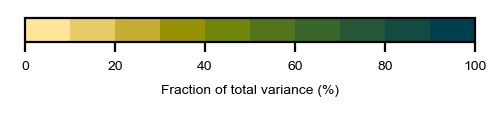
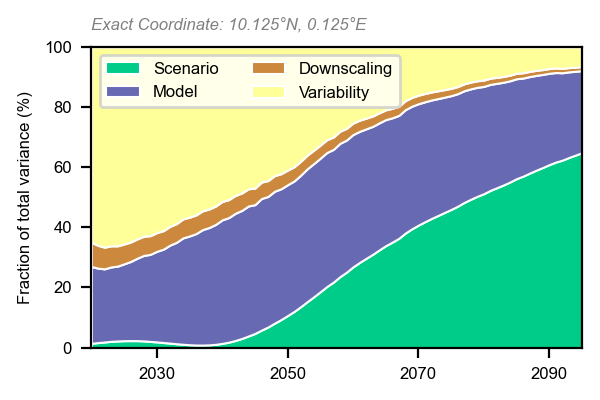
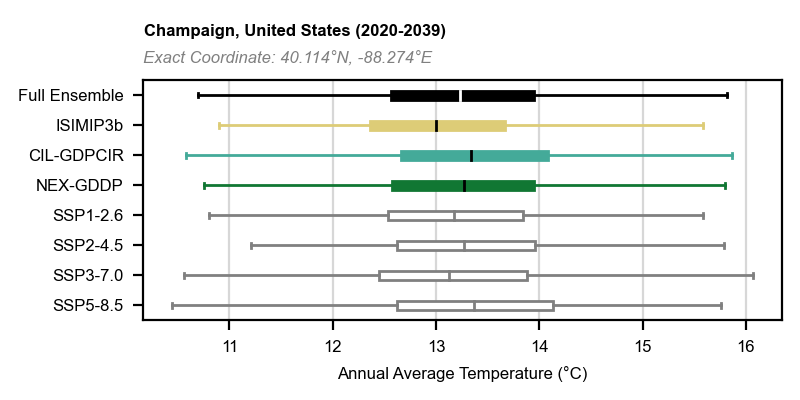

In [29]:
# Instantiate the template with widgets displayed in the sidebar
template = pn.template.MaterialTemplate(
    title="Downscaling and bias-correction uncertainty in CMIP6", sidebar=body_text, header_background="#13294B"
)
# Append a layout to the main area
template.main.append(main)

template.servable()